## Automated Detection of Layers from Pictures

This cell loads one image at a time.

Non-Stacked


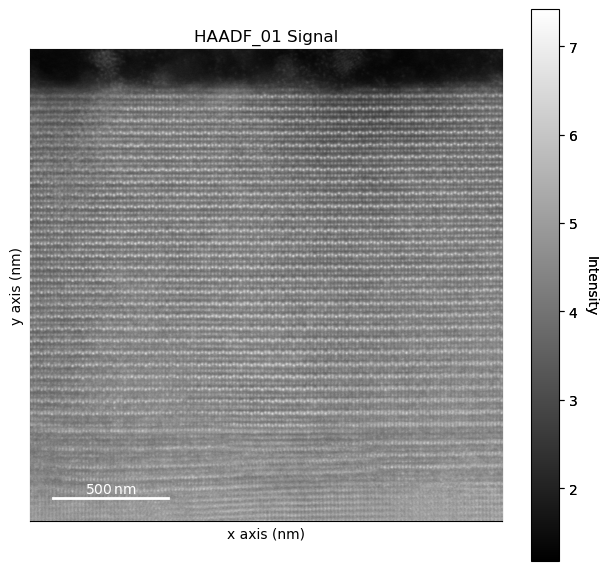

In [1]:
import skimage
import matplotlib.pyplot as plt
import hyperspy.api as hs
import atomap.api as am

import sys
sys.path.append('../..')
import util.crop

stack_num = 0 # The index of stacked image

# Change the name of s_load to load different plots.
# Note that some datasets are in stacks and their data will be 3-dimension,
# where the first dimention is the index of a single stacked image. We want to
# look at one image each of the time, so for those stacked images, please change
# stack_num to view different images.

# Load one file at a time.
# These commented files are some that I want think could be reevaluated later for references.
# s_load = hs.load('../data/images/Jaume LFO/FEI HAADF Sum 06.dm3')
s_load = hs.load('../../data/images/Jaume LFO/HAADF_01.dm3')

if len(s_load.data.shape) == 2: # Non-stacked
    print("Non-Stacked")
    s = s_load
else: # Stacked, where s_load.data.shape = 3
    print("Stacked")
    s = s_load.inav[stack_num]

# Plot the image in pixels. We can plot in nanometers by simply doing s.plot().
import copy
s_copy = copy.deepcopy(s)
for ax in s_copy.axes_manager.signal_axes:
    ax.scale = 1.0
    ax.offset = 0.0

plt.close()
s_copy.plot()

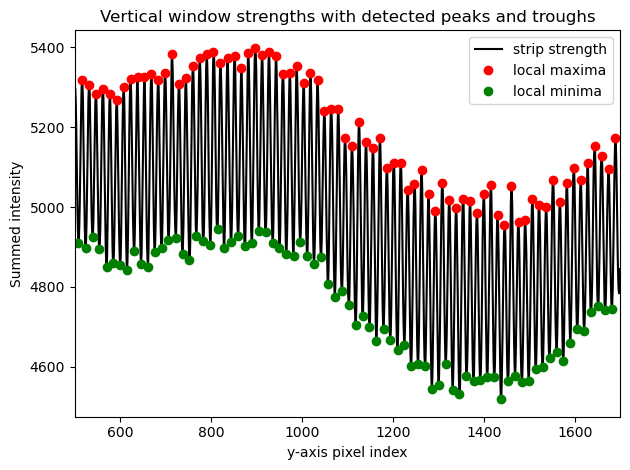

In [2]:
import scipy.signal
import numpy as np

left_bound = 500 # TUNE THIS
right_bound = 1700 # TUNE THIS
start_pixel = 280 # TUNE THIS
end_pixel = 1400 # TUNE THIS

window_detect_height_pix = 1

crop = util.crop.Crop(s, left_bound, right_bound, start_pixel, end_pixel)
crop.get_horizontal_peaks(get_plot=False)
crop.get_vertical_peaks(get_plot=True)

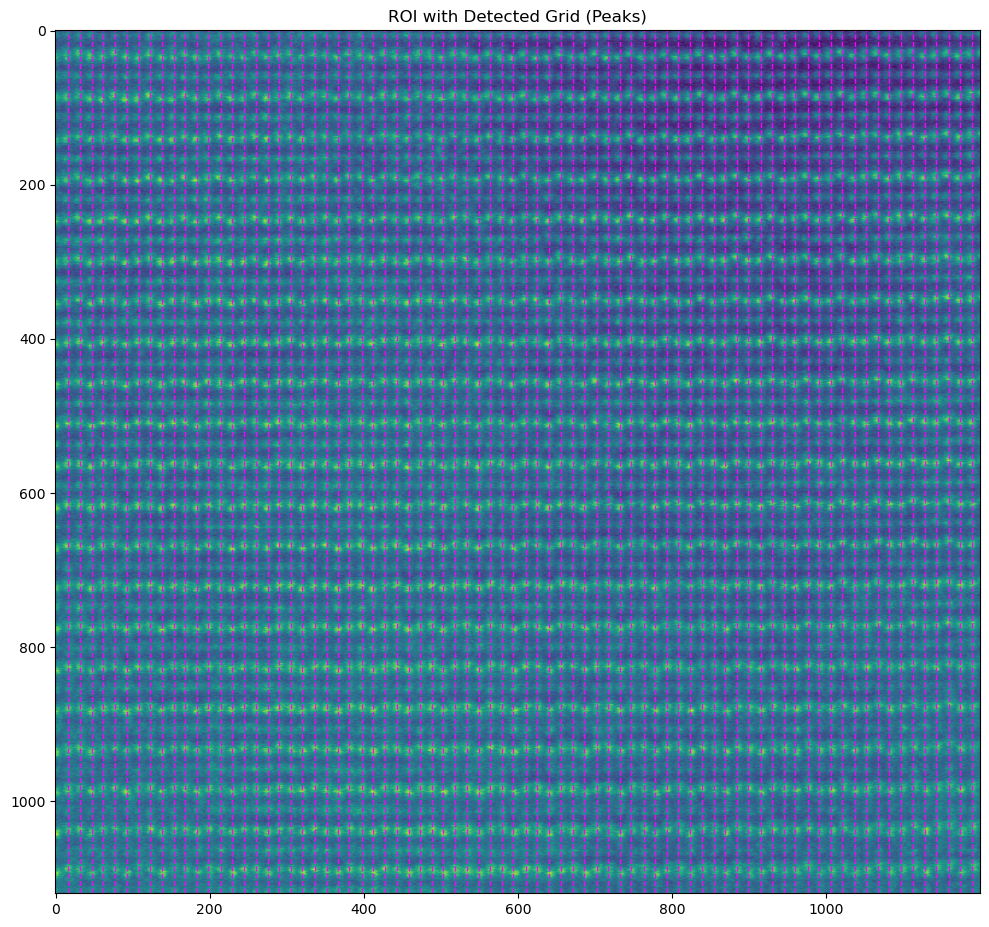

In [ ]:
crop.plot_grid_peaks()

In [4]:
crop.build_grid_dict()
crop.get_atom_positions()
# crop.refine_atom_positions()

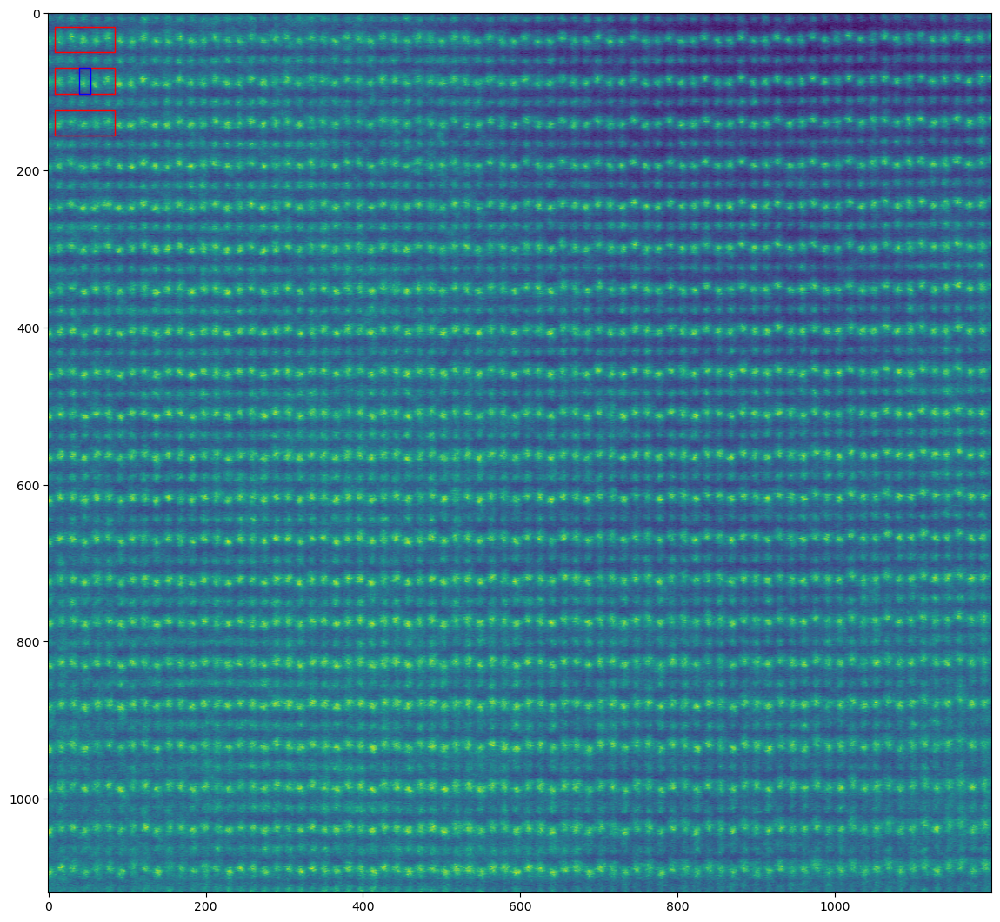

In [5]:
fig, ax_img = plt.subplots(figsize = [14, 14])
ax_img.imshow(crop.roi)

# Draw boxes around grid[0, 0:5], grid[2, 0:5], grid[4, 0:5]
for row in [0, 2, 4]:
    xs = crop.grid[0, row].roi_col_edges[0]
    xe = crop.grid[4, row].roi_col_edges[1]
    ys = crop.grid[0, row].roi_row_edges[0]
    ye = crop.grid[0, row].roi_row_edges[1]
    rect = plt.Rectangle([xs, ys], xe-xs, ye-ys, edgecolor='red', facecolor='none', linewidth=1)
    ax_img.add_patch(rect)

# Draw a box with a different color on grid[2, 2]
xs = crop.grid[2, 2].roi_col_edges[0]
xe = crop.grid[2, 2].roi_col_edges[1]
ys = crop.grid[2, 2].roi_row_edges[0]
ye = crop.grid[2, 2].roi_row_edges[1]
rect_special = plt.Rectangle([xs, ys], xe-xs, ye-ys, edgecolor='blue', facecolor='none', linewidth=1)
ax_img.add_patch(rect_special)

plt.show()

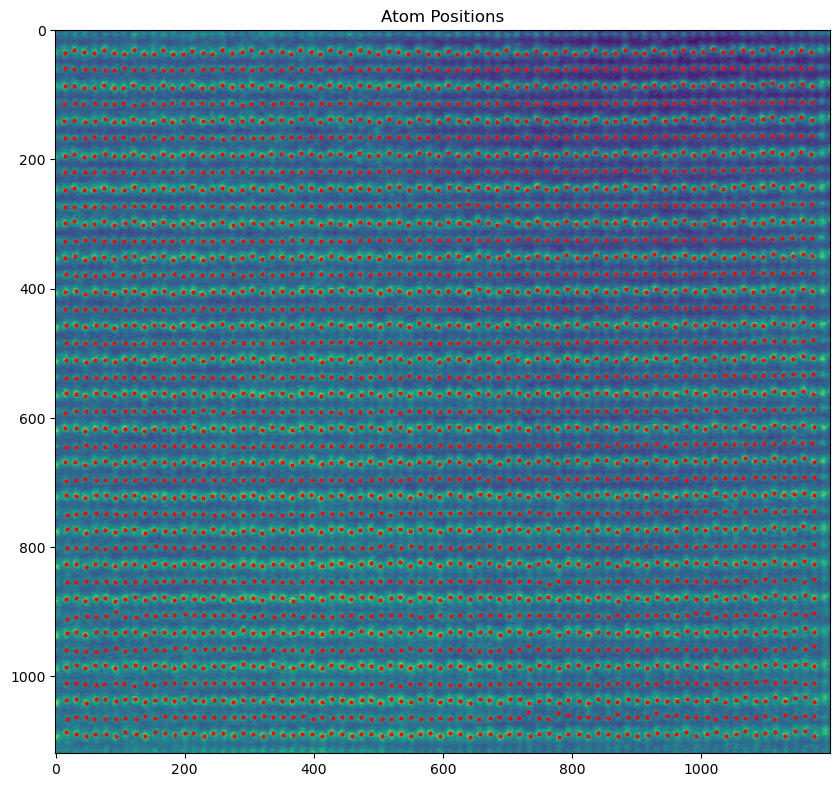

In [6]:
crop.plot_positions()

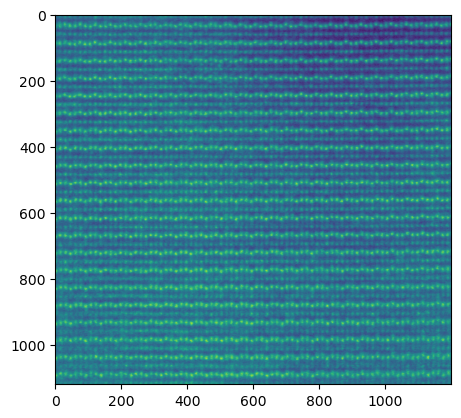

In [ ]:
plt.imshow(crop.roi.data)